<h1>HW5 - Generative Adversarial Networks (GANs)</h1>
<h3><font color=yellow>Total Points: 100</font></h3>



<font color=greeen>Please, name this file as HW5_Q7_{Student_ID}.ipynb</font>

<h2>Full Name: Danial Ataie</h2>
<h2>Student ID: 99100455</h2>

# Init

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision import datasets, transforms

In [2]:
# Data Preprocessing
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.ToTensor()
])

# DataLoader
mnist_dataset = datasets.MNIST(root='./MNIST', train=True, transform=transform, download=True);
data_loader = torch.utils.data.DataLoader(dataset=mnist_dataset, batch_size=32, shuffle=True, num_workers=2);

100%|██████████| 9912422/9912422 [00:00<00:00, 161516779.76it/s]

Extracting ./MNIST/MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 23873806.43it/s]


Extracting ./MNIST/MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 45094620.62it/s]

Extracting ./MNIST/MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 24644927.25it/s]


Extracting ./MNIST/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/MNIST/raw



# Part 1: Implementation of a Basic GAN

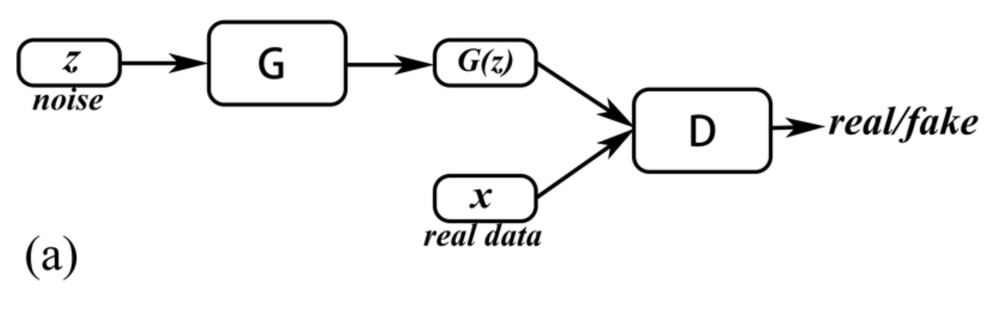

In this section, we will implement a basic Generative Adversarial Network (GAN) to generate fake images of handwritten digits using the MNIST dataset. The main components of this GAN include:

1. **Data Preprocessing**: Loading the MNIST dataset and applying necessary transformations.
2. **Generator**: A neural network that takes random noise as input and generates an image.
3. **Discriminator**: A neural network that takes an image as input and classifies it as real or fake.
4. **Training Loop**: Training the generator and discriminator in alternating steps.
5. **Results**: Visualizing the generated images and logging the training process.

Your task is to follow along with the provided code, understand the underlying concepts, and fill in any missing parts as instructed. Pay close attention to the network architectures, loss functions, and training dynamics to grasp how GANs function.


In [3]:
class Generator(nn.Module):
    def __init__(self, z_dim=100):
        super(Generator, self).__init__()
        self.main = nn.Sequential(

            # First upsampling block
            nn.ConvTranspose2d(z_dim, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            # Second upsampling block
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            # Third upsampling block
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            # Forth upsampling block
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            # Output
            nn.ConvTranspose2d(64, 1, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(z.size(0), z.size(1), 1, 1)
        return self.main(z)

In [4]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(

            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, image):
        return self.main(image).view(-1, 1)

In [5]:
def save_fake_images(epoch, generator, fixed_z, batch_size, z_dim):
    sample_path = 'gan'
    if not os.path.exists(sample_path):
        os.makedirs(sample_path)

    fake_images = generator(fixed_z).view(batch_size, 1, 64, 64)
    plt.figure(figsize=(16, 4))
    for i in range(8):
        img = fake_images[i].cpu().detach().squeeze().numpy()
        img = (img + 1) / 2
        img = np.clip(img, 0, 1)

        plt.subplot(1, 8, i+1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')

    plt.show()

In [6]:
def train_discriminator(discriminator, images, real_labels, fake_image, fake_labels, criterion, optimizer):

    d_real_output = discriminator(images)
    d_real_loss = criterion(d_real_output, real_labels)

    d_fake_output = discriminator(fake_image.detach())
    d_fake_loss = criterion(d_fake_output, fake_labels)

    # Sum of loss
    d_loss = d_real_loss + d_fake_loss

    optimizer.zero_grad()
    d_loss.backward()
    optimizer.step()
    return d_loss.item()

def train_generator(discriminator, fake_image, real_labels, criterion, optimizer):
    # Training to produce images that are classified as real
    prob_fake = discriminator(fake_image)
    g_loss = criterion(prob_fake, real_labels)

    # Backpropagation and optimization
    optimizer.zero_grad()
    g_loss.backward()
    optimizer.step()

    return g_loss.item()

Epoch 1, Step 1871, D Loss: 0.0254, G Loss: 5.2877

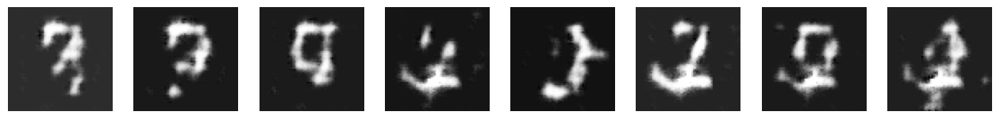

Epoch 2, Step 1871, D Loss: 0.0274, G Loss: 6.9574

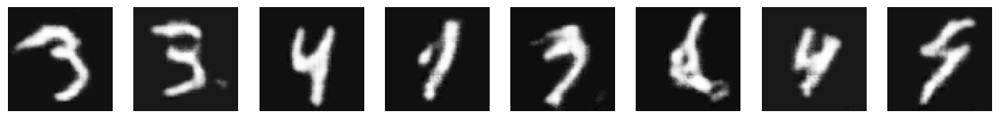

Epoch 3, Step 1871, D Loss: 0.0390, G Loss: 8.0577

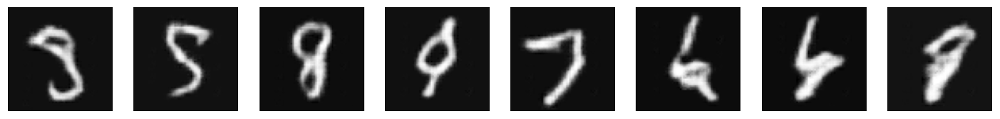

Epoch 4, Step 1871, D Loss: 0.0470, G Loss: 8.5579

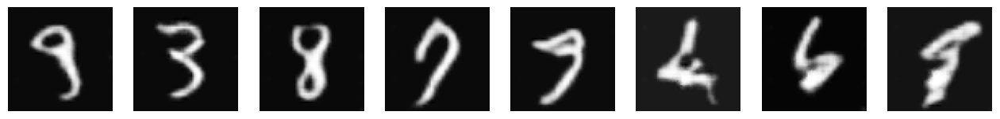

Epoch 5, Step 1871, D Loss: 0.6674, G Loss: 1.7771

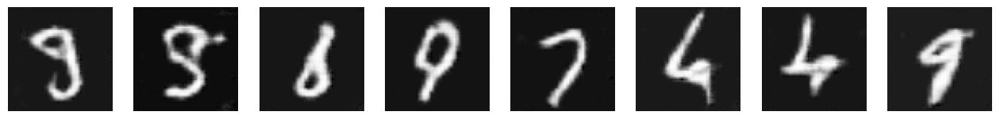

Epoch 6, Step 1871, D Loss: 0.0059, G Loss: 2.8047

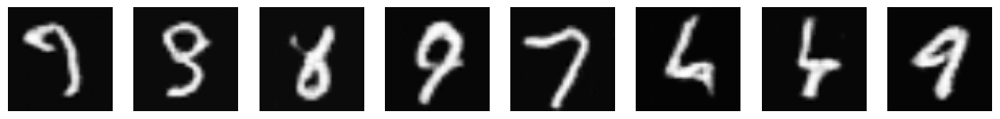

Epoch 7, Step 1871, D Loss: 0.0043, G Loss: 11.4161

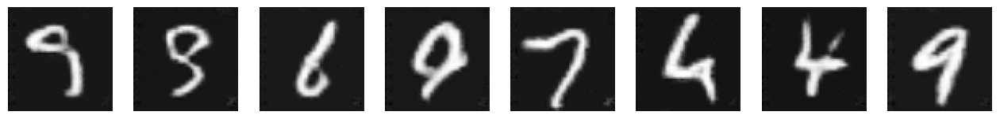

Epoch 8, Step 1871, D Loss: 0.0087, G Loss: 6.8211

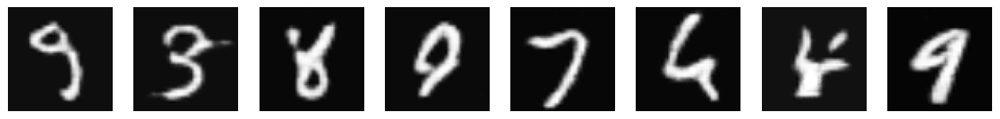

Epoch 9, Step 1871, D Loss: 0.1048, G Loss: 12.3170

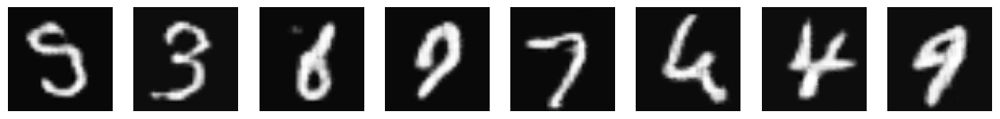

Epoch 10, Step 1871, D Loss: 0.0032, G Loss: 8.6756

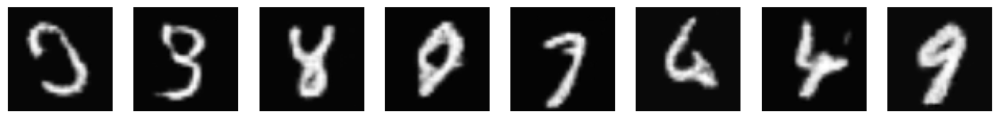

Epoch 11, Step 1871, D Loss: 0.0005, G Loss: 7.7719

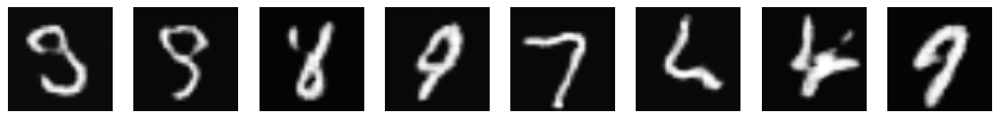

Epoch 12, Step 1871, D Loss: 0.0003, G Loss: 6.0355

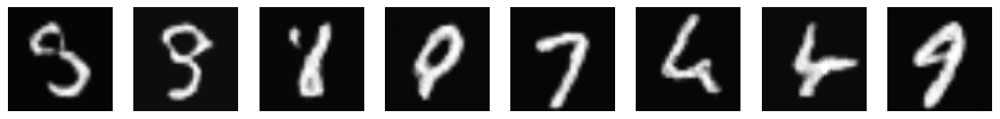

Epoch 13, Step 1871, D Loss: 0.0367, G Loss: 9.2723

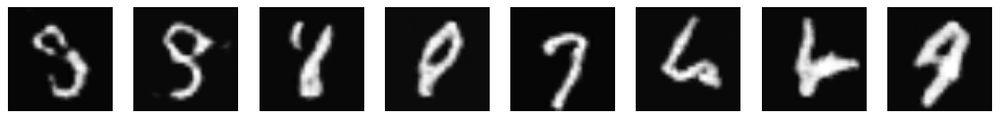

Epoch 14, Step 1871, D Loss: 0.0008, G Loss: 9.0740

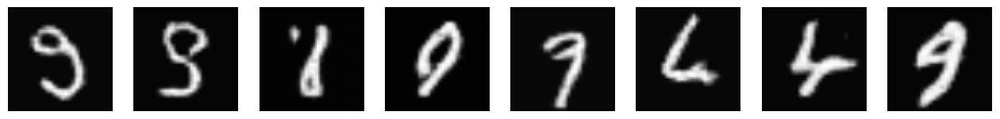

Epoch 15, Step 1871, D Loss: 0.0002, G Loss: 11.6297

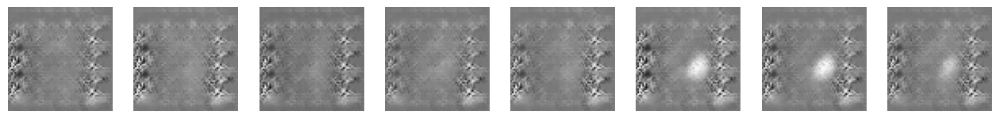

Epoch 16, Step 1871, D Loss: 0.0000, G Loss: 11.4401

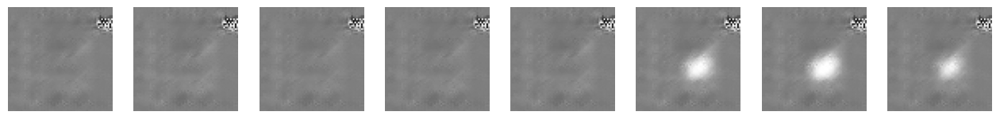

Epoch 17, Step 1871, D Loss: 0.0000, G Loss: 10.9207

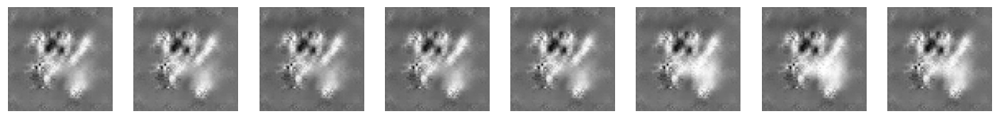

Epoch 18, Step 1871, D Loss: 0.0000, G Loss: 59.9854

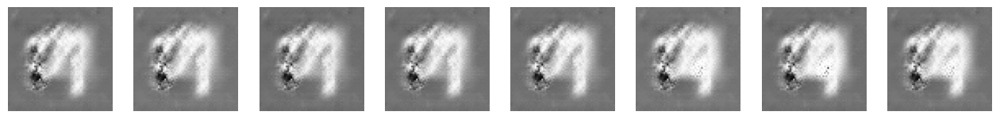

Epoch 19, Step 1871, D Loss: 0.0000, G Loss: 59.7069

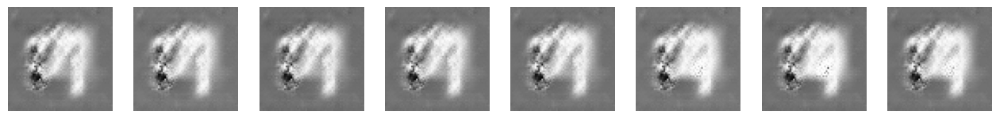

Epoch 20, Step 1871, D Loss: 0.0000, G Loss: 59.4446

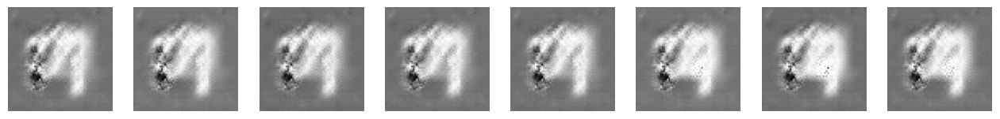

In [7]:
num_epochs = 20
batch_size = 32
z_dim = 100
criterion = nn.BCELoss()

generator = Generator().cuda()
discriminator = Discriminator().cuda()

# Define optimizer
d_optimizer = torch.optim.Adam(discriminator.parameters(),lr=0.0002)
g_optimizer = torch.optim.Adam(generator.parameters(),lr=0.0002)

# To generate a few images after each epoch
fixed_z = Variable(torch.randn(batch_size, z_dim)).cuda()

for epoch in range(num_epochs):
    for i, (images, _) in enumerate(data_loader):
        images = images.cuda()
        z = Variable(torch.randn(batch_size, z_dim)).cuda()
        real_labels = torch.ones(batch_size, 1).cuda()
        fake_labels = torch.zeros(batch_size, 1).cuda()

        # Train Discriminator
        fake_image = generator(z)
        d_loss = train_discriminator(discriminator, images, real_labels, fake_image, fake_labels, criterion, d_optimizer)

        # Train Generator
        z = Variable(torch.randn(batch_size, z_dim)).cuda()
        fake_image = generator(z)
        g_loss = train_generator(discriminator, fake_image, real_labels, criterion, g_optimizer)

        if i % 10 == 0:
            print(f'\rEpoch {epoch+1}, Step {i+1}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}',end='')

    # Generate and save a few fake images
    save_fake_images(epoch+1, generator, fixed_z, batch_size, z_dim)

<br><br><br><br><br><br><br><br>

# Part 2: Implementation of a Conditional GAN (CGAN)

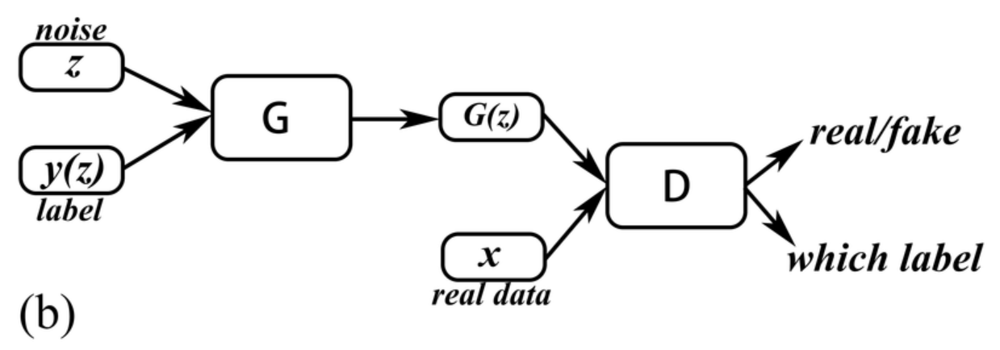

In this section, we will implement a Conditional Generative Adversarial Network (CGAN) to generate fake images of handwritten digits, conditioned on their labels, using the MNIST dataset. This means that we can generate images of specific digits by providing the desired digit label as input to the generator.

The main components of this CGAN include:

1. **Data Preprocessing**: Loading the MNIST dataset with labels and applying necessary transformations.
2. **Generator**: A neural network that takes random noise and a digit label as input and generates an image.
3. **Discriminator**: A neural network that takes an image and a digit label as input and classifies it as real or fake.
4. **Training Loop**: Training the generator and discriminator in alternating steps, taking the digit labels into account.
5. **Results**: Visualizing the generated images conditioned on labels and logging the training process.


In [8]:
class ConditionalGenerator(nn.Module):
    def __init__(self, z_dim=100, label_dim=10):
        super(ConditionalGenerator, self).__init__()
        self.label_embedding = nn.Embedding(label_dim, label_dim)
        self.model = nn.Sequential(
            nn.Linear(z_dim + label_dim, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(True),

            nn.Linear(128, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(True),

            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(True),

            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(True),

            nn.Linear(1024, 1 * 64 * 64),
            nn.Tanh()
        )


    def forward(self, noise, labels):
        labels = self.label_embedding(labels)
        labels = labels.view(labels.size(0), -1)
        gen_input = torch.cat((noise, labels), 1)  # Concatenate along the feature dimension
        img = self.model(gen_input)
        img = img.view(img.size(0), 1, 64, 64)
        return img

In [9]:
class ConditionalDiscriminator(nn.Module):
    def __init__(self, label_dim=10):
        super(ConditionalDiscriminator, self).__init__()
        self.label_embedding = nn.Embedding(label_dim, label_dim)
        self.model = nn.Sequential(
            nn.Linear(1 * 64 * 64 + label_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, img, labels):
        # Concatenate label embedding and image to produce input
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels)), -1)
        validity = self.model(d_in)
        return validity

In [10]:
# Initialize generator and discriminator
generator = ConditionalGenerator().cuda()
discriminator = ConditionalDiscriminator().cuda()

# Loss functions
adversarial_loss = torch.nn.BCELoss()

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [11]:
def save_fake_labled_images(epoch=0):
    sample_path = 'cgan/'
    if not os.path.exists(sample_path):
        os.makedirs(sample_path)

    sample_labels = torch.arange(10).type(torch.LongTensor).cuda()
    z = torch.randn(10, 100).cuda()
    gen_imgs = generator(z, sample_labels)

    fig, axs = plt.subplots(1, 10, figsize=(18, 2))

    for i in range(10):
        img = gen_imgs[i].cpu().detach().squeeze().numpy()
        img = (img + 1) / 2
        img = np.clip(img, 0, 1)

        axs[i].imshow(img, cmap='gray')
        axs[i].set_title(f"Label: {i}")
        axs[i].axis('off')

    plt.tight_layout()
    plt.savefig(sample_path + f"generated_images_with_labels_{epoch}.png")
    plt.show()

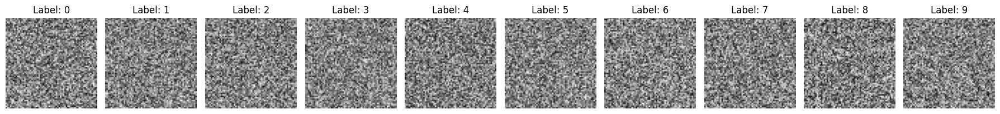

In [12]:
save_fake_labled_images(epoch=0)

Epoch 1, Step 1871, D Loss: 0.2533, G Loss: 1.9031

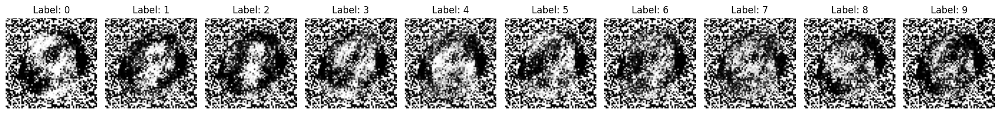

Epoch 2, Step 1871, D Loss: 0.1094, G Loss: 4.1303

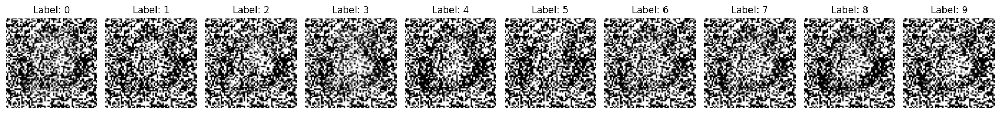

Epoch 3, Step 1871, D Loss: 0.1249, G Loss: 4.5521

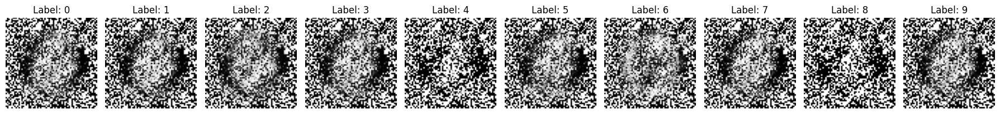

Epoch 4, Step 1871, D Loss: 0.0320, G Loss: 4.6673

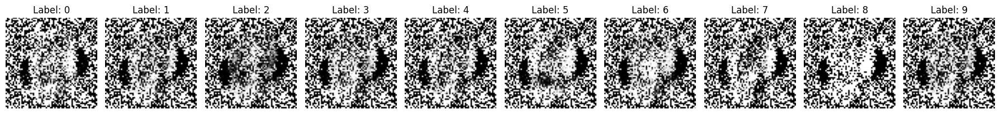

Epoch 5, Step 1871, D Loss: 0.0171, G Loss: 7.1761

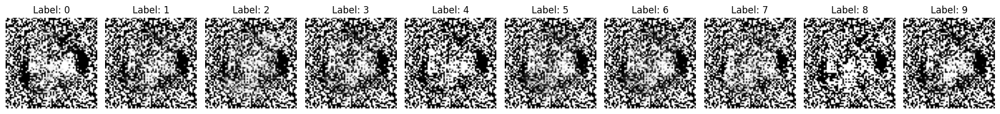

Epoch 6, Step 1871, D Loss: 0.0094, G Loss: 7.9735

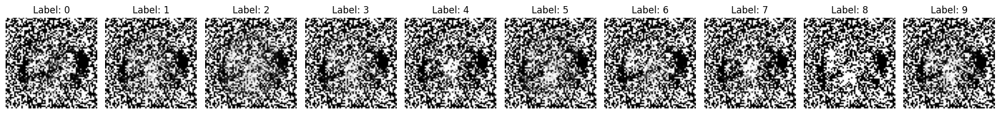

Epoch 7, Step 1871, D Loss: 0.0068, G Loss: 8.2394

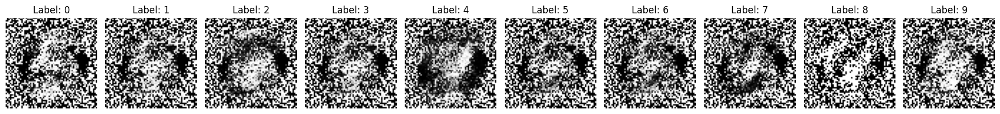

Epoch 8, Step 1871, D Loss: 0.0079, G Loss: 8.6944

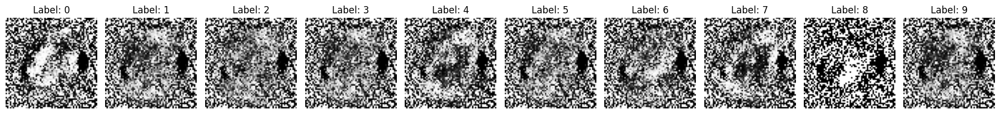

Epoch 9, Step 1871, D Loss: 0.0035, G Loss: 9.5286

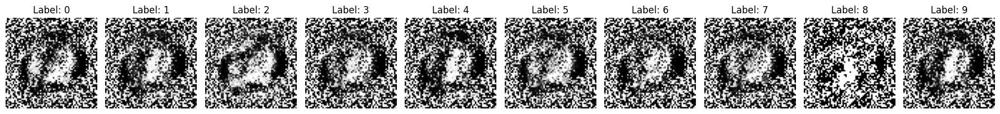

Epoch 10, Step 1871, D Loss: 0.0057, G Loss: 9.7721

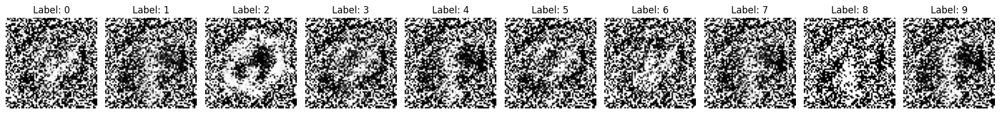

Epoch 11, Step 1871, D Loss: 0.0062, G Loss: 11.2811

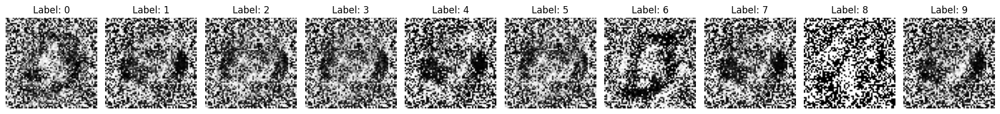

Epoch 12, Step 1871, D Loss: 0.0121, G Loss: 11.2361

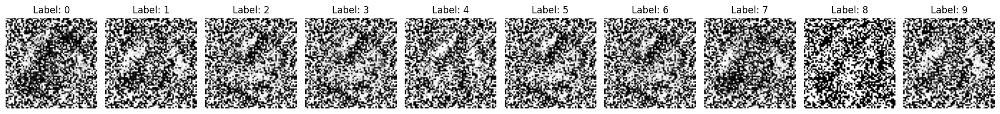

Epoch 13, Step 1871, D Loss: 0.0013, G Loss: 11.6577

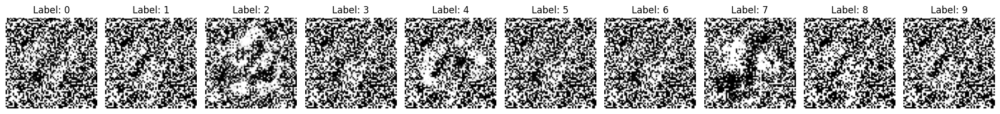

Epoch 14, Step 1871, D Loss: 0.0024, G Loss: 9.4220

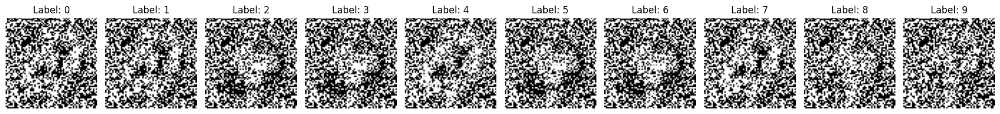

Epoch 15, Step 1871, D Loss: 0.0053, G Loss: 9.3220

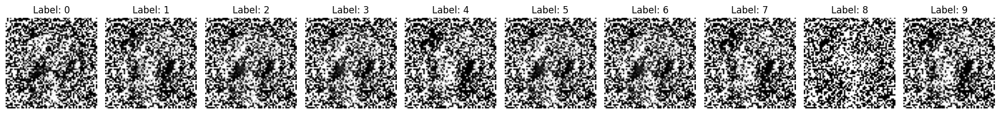

Epoch 16, Step 1871, D Loss: 0.0022, G Loss: 12.1970

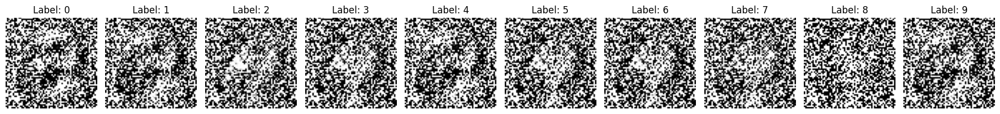

Epoch 17, Step 1871, D Loss: 0.0013, G Loss: 13.5686

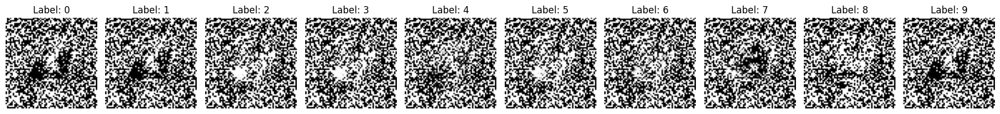

Epoch 18, Step 1871, D Loss: 0.0026, G Loss: 12.7398

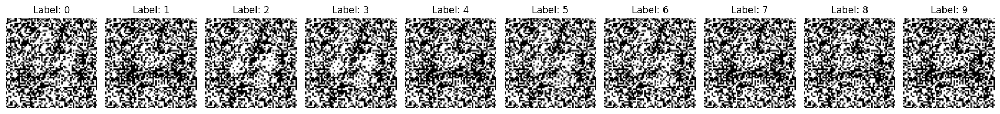

Epoch 19, Step 1871, D Loss: 0.0012, G Loss: 10.4142

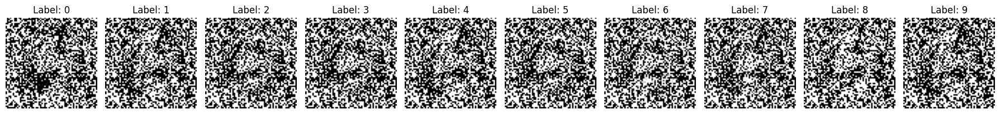

Epoch 20, Step 1871, D Loss: 0.0035, G Loss: 10.8155

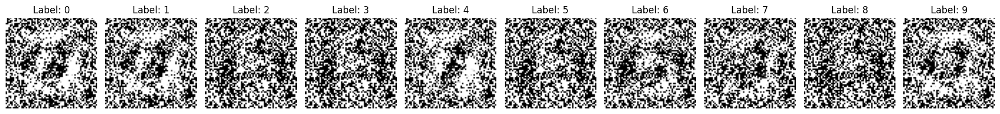

Epoch 21, Step 1871, D Loss: 0.0005, G Loss: 12.1785

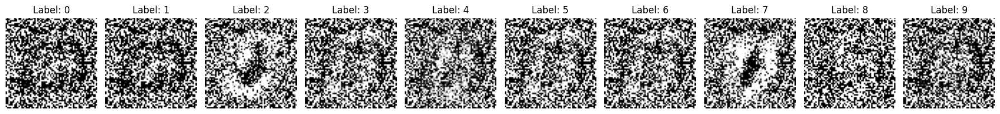

Epoch 22, Step 1871, D Loss: 0.0011, G Loss: 12.9107

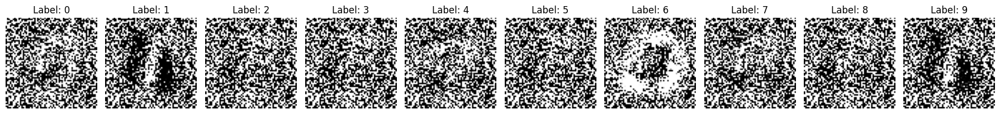

Epoch 23, Step 1871, D Loss: 0.0008, G Loss: 15.2075

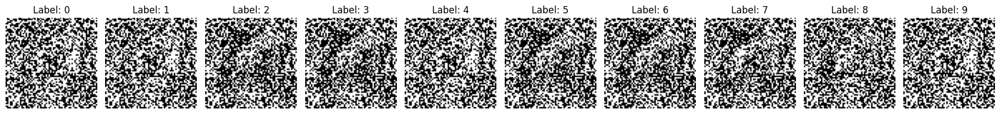

Epoch 24, Step 1871, D Loss: 0.0007, G Loss: 11.9943

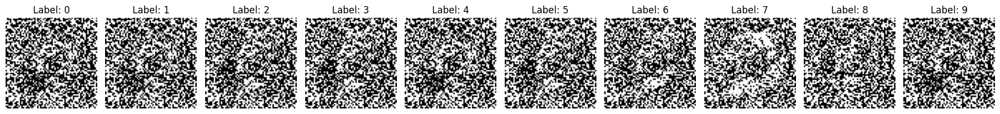

Epoch 25, Step 1871, D Loss: 0.0003, G Loss: 14.9042

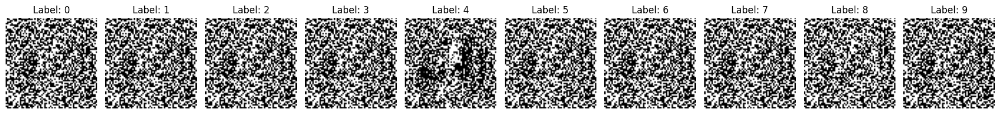

Epoch 26, Step 1871, D Loss: 0.0002, G Loss: 14.7305

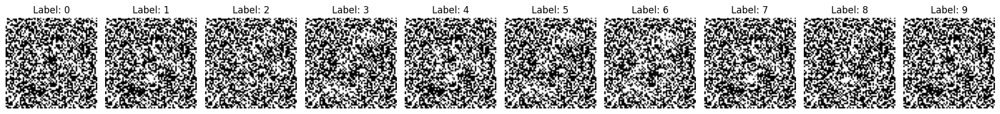

Epoch 27, Step 1871, D Loss: 0.0002, G Loss: 14.7844

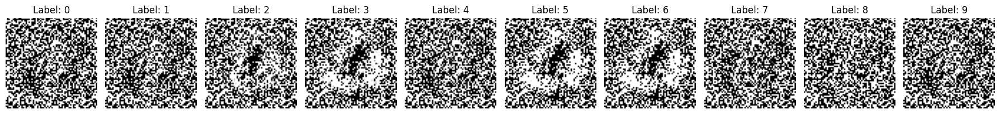

Epoch 28, Step 1871, D Loss: 0.0004, G Loss: 15.1177

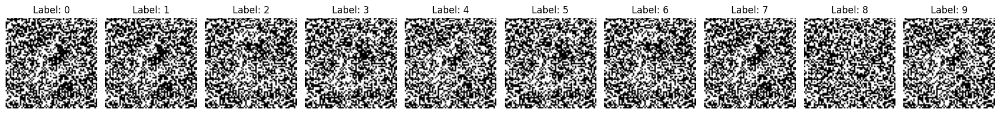

Epoch 29, Step 1871, D Loss: 0.0018, G Loss: 12.9087

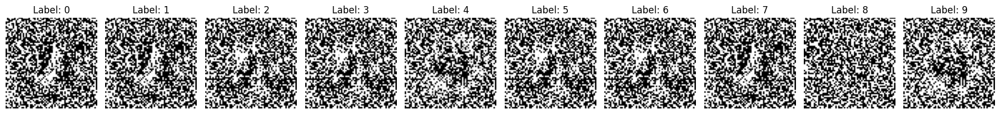

Epoch 30, Step 1871, D Loss: 0.0004, G Loss: 14.9196

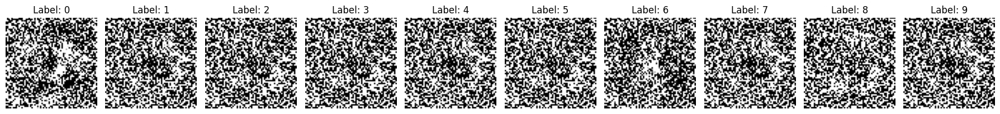

Epoch 31, Step 1871, D Loss: 0.0005, G Loss: 15.0778

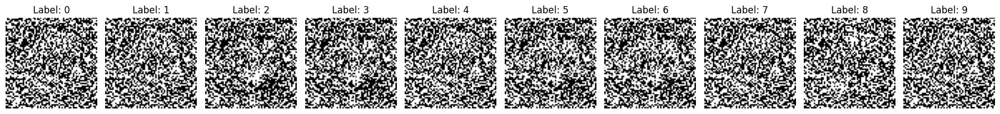

Epoch 32, Step 1871, D Loss: 0.0015, G Loss: 15.8018

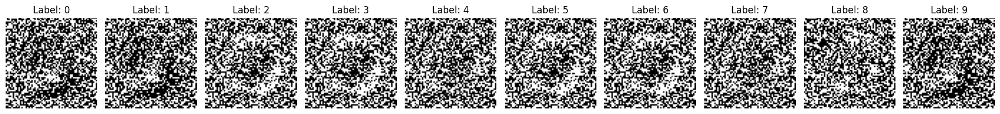

Epoch 33, Step 1871, D Loss: 0.0002, G Loss: 18.6430

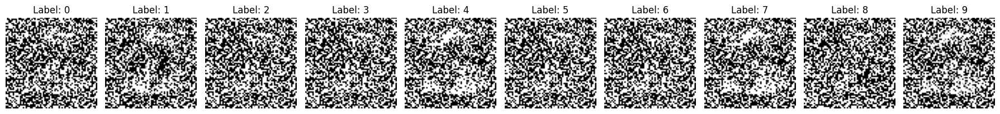

Epoch 34, Step 1871, D Loss: 0.0006, G Loss: 13.4150

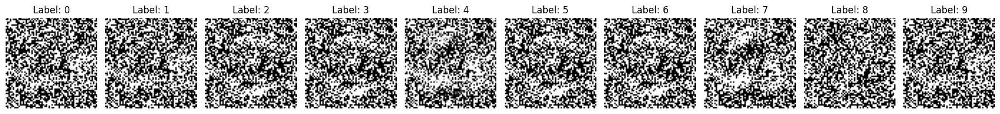

Epoch 35, Step 231, D Loss: 0.0017, G Loss: 11.9357

KeyboardInterrupt: 

In [15]:
num_epochs = 20
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Labels for generated images
sample_labels = torch.randint(0, 10, (32,)).type(torch.LongTensor).cuda()

for epoch in range(num_epochs): # at first instead of num_epochs it was 200 so I stopped it
    for i, (imgs, labels) in enumerate(data_loader):

        labels = labels.to(device)
        batch_size = imgs.shape[0]

        # Adversarial ground truths
        valid = torch.ones(batch_size, 1).cuda()
        fake = torch.zeros(batch_size, 1).cuda()

        # Train Generator
        optimizer_G.zero_grad()

        # Sample noise and labels
        noise = torch.randn(batch_size, z_dim).cuda()
        gen_labels = torch.randint(0, 10, (batch_size,)).type(torch.LongTensor).cuda()
        gen_imgs = generator(noise, gen_labels)

        # Calculate and backpropagate generator loss
        validity = discriminator(gen_imgs, gen_labels)
        g_loss = adversarial_loss(validity, valid)
        g_loss.backward()
        optimizer_G.step()

        # Train Discriminator
        optimizer_D.zero_grad()

        # Pass real images to discriminator
        real_imgs = Variable(imgs).cuda()
        real_validity = discriminator(real_imgs, labels)
        d_real_loss = adversarial_loss(real_validity, valid)

        # Pass fake images to discriminator
        fake_validity = discriminator(gen_imgs.detach(), gen_labels)
        d_fake_loss = adversarial_loss(fake_validity, fake)

        # Backporpagate sum of real and fake losses
        d_loss = (d_real_loss + d_fake_loss) / 2
        d_loss.backward()
        optimizer_D.step()

        # Save training progress
        if i % 10 == 0:
            print(f'\rEpoch {epoch+1}, Step {i+1}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}', end='')

    save_fake_labled_images(epoch)

**Question:** [10 score]

With learned insights from the notebook, compare Conditional Generative Adversarial Networks (CGANs) and traditional Generative Adversarial Networks (GANs) in terms of architecture, input data, loss functions, and potential applications.</br>

<h2>Comparison: CGANs vs. GANs</h2>
<ul>
<li><strong>Architecture:</strong><br>
    The main difference in the architecture is that GAN is using convolutional layers, but CGAN is using linear layers. And the GANs' input is just the random noise (for generator) and image (for discriminator), but in CGAN a label is also added.</li>
<li><strong>Input data:</strong><br>
    It's obvious that the input of GAN is only the random noise (for generator) and image (for discriminator), but in CGAN a label is also added.</li>
<li><strong>Loss functions:</strong><br>
    This one is similar for both of them.</li>
<li><strong>Potential applications:</strong>
    <ul>
    <li>GAN:
        <ul>
        <li>Image generation.</li>
        <li>Image-to-image translation.</li>
        <li>Unsupervised learning and feature learning.</li>
        </ul>
    </li>
    <li>CGAN:
        <ul>
        <li>Targeted image generation.</li>
        <li>Text-to-image synthesis.</li>
        <li>Improving the diversity and quality of generated samples in specific contexts.</li>
        </ul>
    </li>
    </ul>
</li>
</ul>